In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/Dataset/Kvasir-Segmentation/kvasir-seg.zip -d /content/drive/MyDrive/Dataset/Kvasir-Segmentation

In [ ]:
!pip install timm
!pip install poutyne
!pip install segmentation-models-pytorch

In [ ]:
import os
os.listdir('/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Kvasir-SEG')

['masks', 'kavsir_bboxes.json', 'images']

In [ ]:
print(len(os.listdir('/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Kvasir-SEG/images')))
print(len(os.listdir('/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Kvasir-SEG/masks')))

1000
1000


cju7cp6dw244p0818gncdol4m.jpg


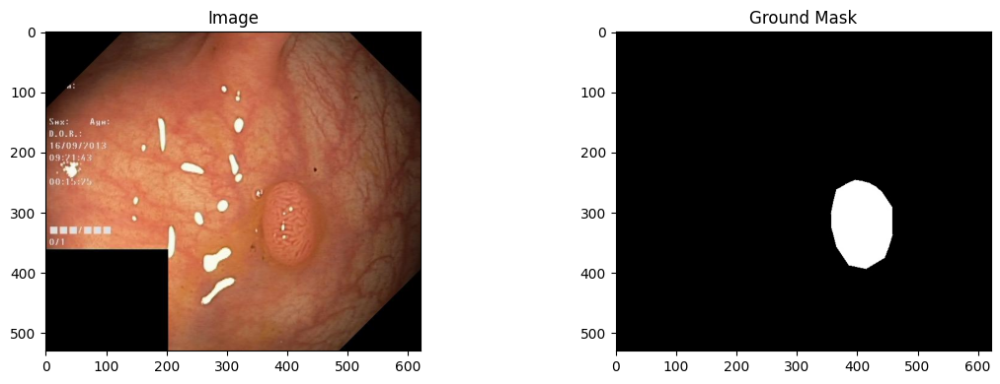

cju45rj7ln8980850a7821fov.jpg


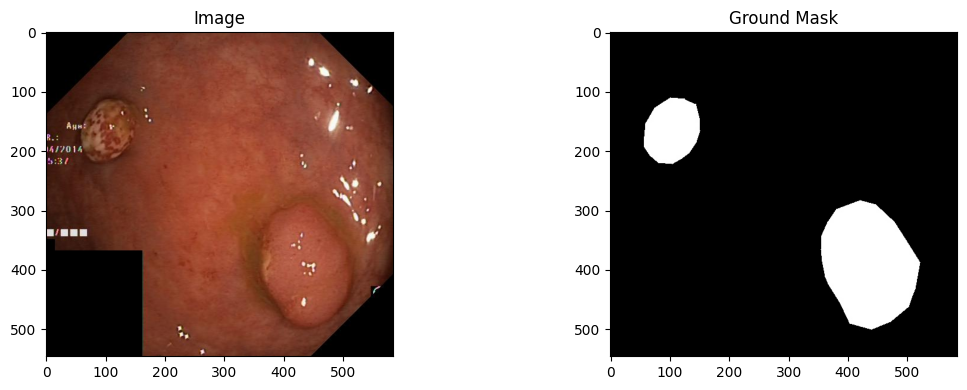

ck2bxskgxxzfv08386xkqtqdy.jpg


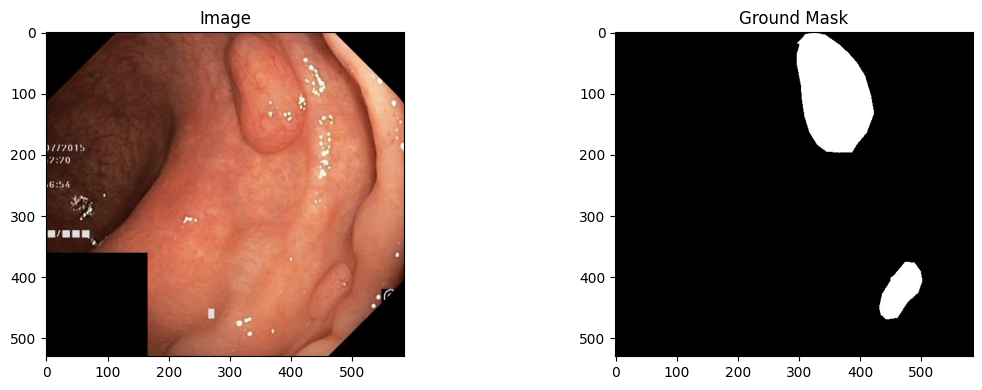

cju2hw5gjlr5h0988so2qqres.jpg


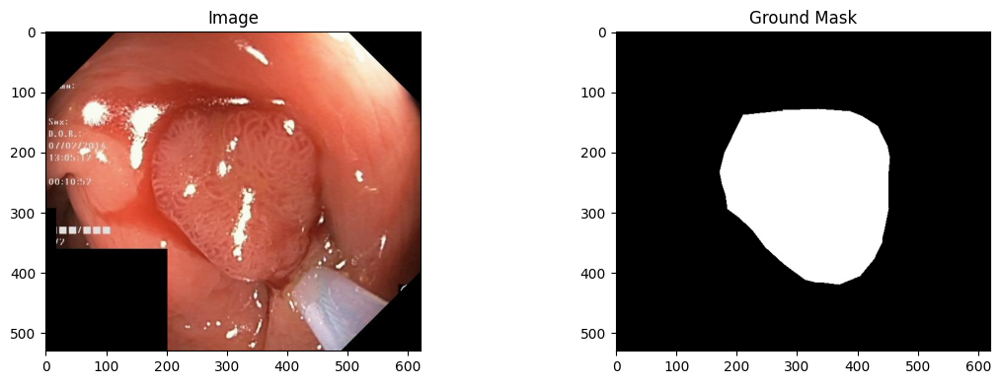

cju8dqkrqu83i0818ev74qpxq.jpg


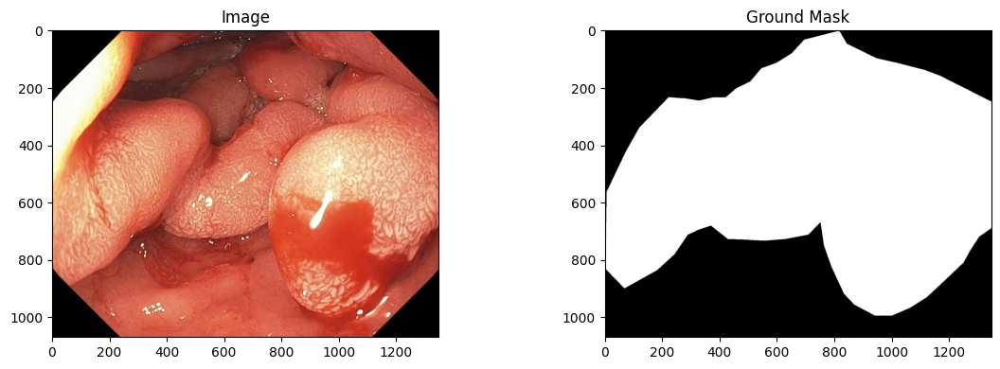

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

dataset_folder = '/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Kvasir-SEG'

image_filenames = os.listdir(os.path.join(dataset_folder, 'images'))

# Taking a few random images for visualization
sample_images = np.random.choice(image_filenames, size=5)

# Visualize the selected images and their masks
for image_filename in sample_images:
    # Load image
    image_path = os.path.join(dataset_folder, 'images', image_filename)
    image = Image.open(image_path)

    # Load corresponding mask
    mask_path = os.path.join(dataset_folder, 'masks', image_filename)
    mask = Image.open(mask_path)

    # Convert mask to a numpy array for visualization
    mask_array = np.array(mask)

    print(image_filename) #corresponding mask and image have same file name

    # Plot the image and mask
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Image')

    plt.subplot(1, 2, 2)
    plt.imshow(mask_array, cmap='gray')
    plt.title('Ground Mask')

    plt.tight_layout()
    plt.show()


In [ ]:
from PIL import Image
mask1 = Image.open("/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Kvasir-SEG/masks/cju0qkwl35piu0993l0dewei2.jpg")
print(mask1.mode)

RGB


In [ ]:
# Loading any mask image
mask_image = Image.open("/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Kvasir-SEG/masks/cju0qkwl35piu0993l0dewei2.jpg")

# Converting the mask image to a NumPy array
mask_array = np.array(mask_image)

# Finding unique pixel values
unique_values = np.unique(mask_array)

print("Unique pixel Values:", unique_values)


Unique pixel Values: [  0   1   2   3   4   5   6   7   8 247 248 249 250 251 252 253 254 255]


## Data processing

In [ ]:
import os
import torch
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
from poutyne import set_seeds
from sklearn.model_selection import train_test_split

# Set seeds for reproducibility
set_seeds(42)
torch.manual_seed(42)

dataset_folder = '/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Kvasir-SEG'

class SegmentationDataset(Dataset):
    def __init__(self, data_folder, image_filenames, transform=None, threshold=0.5):
        self.data_folder = data_folder
        self.image_filenames = image_filenames
        self.transform = transform
        self.threshold = threshold

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_filename = self.image_filenames[idx]

        # Load input image
        image_path = os.path.join(self.data_folder, 'images', image_filename)
        image = Image.open(image_path)

        # Load corresponding mask
        mask_filename = os.path.join(self.data_folder, 'masks', image_filename)
        mask = Image.open(mask_filename).convert('L')  # grayscale

        # Convert to NumPy arrays
        image = np.array(image)
        mask = np.array(mask)
        mask = (mask > self.threshold).astype(np.uint8)

        # Apply Albumentations transform
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        mask = np.expand_dims(mask, axis=0)

        return image, mask

# Define Albumentations transforms for images and masks
train_transforms = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.5),
    A.RandomRotate90(p=0.5),
    A.Resize(352, 352),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),
])


test_transforms = A.Compose([
    A.Resize(352, 352),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2(),
])


# Set seed for data splitting
image_filenames = os.listdir(os.path.join(dataset_folder, 'images'))
train_filenames, test_val_filenames = train_test_split(image_filenames, test_size=0.1, random_state=42)
val_filenames, test_filenames = train_test_split(test_val_filenames, test_size=0.5, random_state=42)

# Create datasets for train, validation, and test
train_dataset = SegmentationDataset(dataset_folder, train_filenames, transform=train_transforms)
val_dataset = SegmentationDataset(dataset_folder, val_filenames, transform=test_transforms)
test_dataset = SegmentationDataset(dataset_folder, test_filenames, transform=test_transforms)

# Create data loaders for train, validation, and test
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=False)


# number of images in each set
print(f"Number of training images: {len(train_dataset)}")
print(f"Number of validation images: {len(val_dataset)}")
print(f"Number of test images: {len(test_dataset)}")


Number of training images: 900
Number of validation images: 50
Number of test images: 50


In [ ]:
for x, y in train_loader:
  print(x.shape)
  print(y.shape)
  break

torch.Size([16, 3, 352, 352])
torch.Size([16, 1, 352, 352])


In [ ]:
# To check unique mask values
train_sample_loader = torch.utils.data.DataLoader(train_dataset, batch_size=1)

# Iterate through the dataset and print unique mask values
for i, (image, mask) in enumerate(train_sample_loader):
    unique_values = torch.unique(mask)
    print(f"Sample {i}: Unique Mask Values: {unique_values}")
    break

Sample 0: Unique Mask Values: tensor([0, 1], dtype=torch.uint8)


## Segmentation

In [ ]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
import torch
from torch import nn
from torch.optim import Adam
from torchvision import transforms
from poutyne import Model, ModelCheckpoint
from poutyne.framework.callbacks import EarlyStopping
from torchmetrics.detection import IntersectionOverUnion as IOU
import matplotlib.pyplot as plt

In [ ]:
network = smp.UnetPlusPlus(
    encoder_name ='efficientnet-b2',
    encoder_weights ='imagenet',
    activation ='sigmoid',
    in_channels = 3,
    classes = 1,  #for binary
)
# criterion = DiceLoss(mode='binary')
criterion = smp.losses.FocalLoss(smp.losses.BINARY_MODE)
optimizer = torch.optim.Adam(network.parameters(), lr=0.001)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b2-8bb594d6.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b2-8bb594d6.pth
100%|██████████| 35.1M/35.1M [00:00<00:00, 167MB/s]


In [ ]:
network

UnetPlusPlus(
  (encoder): EfficientNetEncoder(
    (_conv_stem): Conv2dStaticSamePadding(
      3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d((0, 1, 0, 1))
    )
    (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
          (static_padding): ZeroPad2d((1, 1, 1, 1))
        )
        (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          32, 8, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          8, 32, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_project_conv): Conv2dStaticSam

In [ ]:
from poutyne import Model, ModelCheckpoint, Callback, CSVLogger, OptimizerCheckpoint

#callbacks

save_path = '/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Checkpoint'

# Creating saving directory
os.makedirs(save_path, exist_ok=True)

callbacks = [
    ModelCheckpoint(os.path.join(save_path, 'UnetPlusPlus_modelcheckpoint_{epoch}.ckpt'),
                        monitor="val_dice",
                        mode="max",
                        save_best_only=False,
                        restore_best=False,
                        verbose=True,),
OptimizerCheckpoint(os.path.join(save_path, 'UnetPlusPlus_OptimizerState_{epoch}.ckpt'),
                        monitor="val_dice",
                        mode="max",
                        save_best_only=False,
                        restore_best=False,
                        verbose=True,),
    # Save the losses for each epoch in a TSV.
    CSVLogger(os.path.join(save_path, 'log_50_epoch.tsv'), separator='\t'),
]

In [ ]:
from torchmetrics import JaccardIndex #also known as IoU
from torchmetrics import Dice

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
network=network.to(device)

dice = Dice()
jaccard_index = JaccardIndex(num_classes=1, task="binary")

model = Model(
    network,
    optimizer,
    criterion,
    device=device,
    epoch_metrics=[ dice, jaccard_index],

)

# Train
history_list = model.fit_generator(train_loader, val_loader, epochs=50, callbacks=callbacks)


Epoch:  1/50 Train steps: 57 Val steps: 4 1m8.58s loss: 0.213570 dice: 0.625308 binary_jaccard_index: 0.454872 val_loss: 0.173329 val_dice: 0.717377 val_binary_jaccard_index: 0.559304
Epoch 1: saving file to /content/drive/MyDrive/Dataset/Kvasir-Segmentation/Checkpoint/UnetPlusPlus_modelcheckpoint_1.ckpt
Epoch 1: saving file to /content/drive/MyDrive/Dataset/Kvasir-Segmentation/Checkpoint/UnetPlusPlus_OptimizerState_1.ckpt
Epoch:  2/50 Train steps: 57 Val steps: 4 59.27s loss: 0.165914 dice: 0.769693 binary_jaccard_index: 0.625611 val_loss: 0.169217 val_dice: 0.795257 val_binary_jaccard_index: 0.660106
Epoch 2: saving file to /content/drive/MyDrive/Dataset/Kvasir-Segmentation/Checkpoint/UnetPlusPlus_modelcheckpoint_2.ckpt
Epoch 2: saving file to /content/drive/MyDrive/Dataset/Kvasir-Segmentation/Checkpoint/UnetPlusPlus_OptimizerState_2.ckpt
Epoch:  3/50 Train steps: 57 Val steps: 4 58.97s loss: 0.162740 dice: 0.762114 binary_jaccard_index: 0.615657 val_loss: 0.167092 val_dice: 0.742721

In [ ]:
#we can also see the logs from saved logs
import pandas as pd
logs = pd.read_csv(os.path.join(save_path, 'log_50_epoch.tsv'), sep='\t')
print(logs)

    epoch       time     lr      loss      dice  binary_jaccard_index  \
0       1  68.575514  0.001  0.213570  0.625308              0.454872   
1       2  59.266771  0.001  0.165914  0.769693              0.625611   
2       3  58.974922  0.001  0.162740  0.762114              0.615657   
3       4  59.044856  0.001  0.160522  0.806410              0.675617   
4       5  59.210479  0.001  0.159098  0.823589              0.700086   
5       6  59.069464  0.001  0.158173  0.836107              0.718371   
6       7  59.028013  0.001  0.158550  0.833082              0.713916   
7       8  58.670561  0.001  0.158236  0.823726              0.700284   
8       9  58.919638  0.001  0.158224  0.828356              0.707004   
9      10  58.782823  0.001  0.157505  0.839411              0.723263   
10     11  59.123819  0.001  0.157067  0.848933              0.737518   
11     12  59.004744  0.001  0.158361  0.821383              0.696904   
12     13  58.920253  0.001  0.158518  0.806500    

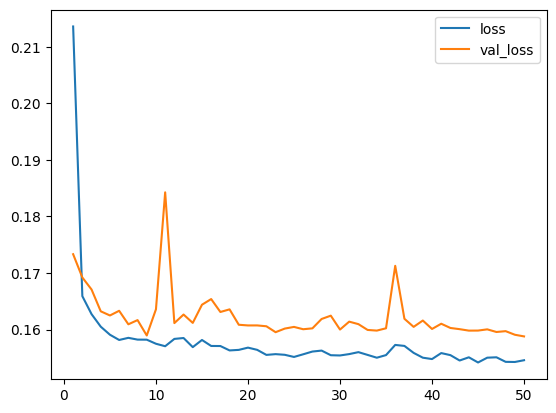

In [ ]:
#plotting training and validation loss
metrics = ['loss', 'val_loss']
plt.plot(logs['epoch'], logs[metrics])
plt.legend(metrics)
plt.show()

In [ ]:
#finding best epoch
best_epoch_idx = logs['val_binary_jaccard_index'].idxmax()
best_epoch = int(logs.loc[best_epoch_idx]['epoch'])
print("Best epoch: %d" % best_epoch)

Best epoch: 47


In [ ]:
model = Model(network, optimizer, criterion, device=device, epoch_metrics=[ dice, jaccard_index])
model.load_weights('/content/drive/MyDrive/Dataset/Kvasir-Segmentation/Checkpoint/UnetPlusPlus_modelcheckpoint_47.ckpt')
loss, (dice_coefficient, jaccard) = model.evaluate_generator(test_loader)

Test steps: 4 1m5.59s test_loss: 0.156131 test_dice: 0.907919 test_binary_jaccard_index: 0.831366


In [ ]:
# Initialize lists to store predicted masks and ground truth masks
predicted_masks_list = []
ground_truth_masks_list = []

# Iterate through all batches of test data
for images, masks_gt in test_loader:
    # Predict masks using the trained model
    with torch.no_grad():
        images = images.to(device)
        masks_pred = model.predict(images)

    # Append the predicted masks and ground truth masks to the lists
    predicted_masks_list.append(masks_pred)
    ground_truth_masks_list.append(masks_gt.cpu().numpy())

# Concatenate the predicted masks and ground truth masks along the batch dimension
predicted_masks = np.concatenate(predicted_masks_list, axis=0)
ground_truth_masks = np.concatenate(ground_truth_masks_list, axis=0)

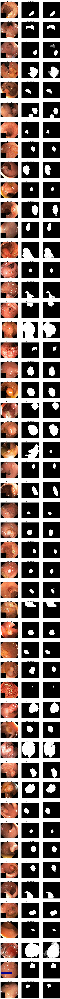

In [ ]:
import os
import matplotlib.pyplot as plt

num_images = len(test_filenames)

images_np = images.cpu().numpy()[:num_images] # Transformed Image
masks_gt_np = ground_truth_masks[:num_images] # Transformed masks
masks_pred_np = predicted_masks[:num_images]

# Create subplots for visualization
fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))

for i in range(num_images):
    # Get the original test image using the filename
    image_filename = test_filenames[i]
    image_path = os.path.join(dataset_folder, 'images', image_filename)
    mask_path = os.path.join(dataset_folder, 'masks', image_filename)

    original_image = Image.open(image_path)
    original_ground_truth_mask = Image.open(mask_path)

    # Display the original test image
    axes[i, 0].imshow(original_image)
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    # # Display the Transformed ground truth mask
    # axes[i, 1].imshow(masks_gt_np[i, 0], cmap="gray")
    # axes[i, 1].set_title(" Transformed Ground Truth Mask")
    # axes[i, 1].axis("off")

    # Display the Original ground truth mask
    axes[i, 1].imshow(original_ground_truth_mask, cmap="gray")
    axes[i, 1].set_title("Ground Truth Mask")
    axes[i, 1].axis("off")

    # Display the predicted mask
    axes[i, 2].imshow(masks_pred_np[i, 0], cmap="gray")
    axes[i, 2].set_title("Predicted Mask")
    axes[i, 2].axis("off")

# plt.tight_layout()
plt.show()


# Kvasir-SEG Binary Segmentation

This repository contains code for Gastrointestinal (GI) tract polyp segmentation.

## Workflow

**1. Dataset details:** The Kvasir-SEG dataset contains 1000 polyp images and their corresponding ground truth from the Kvasir Dataset v2. The resolution of the images contained in Kvasir-SEG varies from 332x487 to 1920x1072 pixels. The images and its corresponding masks are stored in two separate folders with the same filename. The image files are encoded using JPEG compression, and online browsing is facilitated. The open-access dataset can be easily downloaded for research and educational purposes. The bounding box (coordinate points) for the corresponding images are stored in a JSON file. This dataset is designed to push the state of the art solution for the polyp detection task.

**2. EDA:**: After loading the dataset, I have observed that there are 1000 images and 1000 masks images which reprenst the polyp. I plotted the image and corresponding mask together and understood that I have to classify each pixel in an image into one of two classes: foreground (polyp) or background. I also checked whether the mask image is in grayscale or not.

**3. Data Processing:**: For creating a data preprocessing pipeline, I defined a custom SegmentationDataset class that loads images and masks, applies data augmentations for training, and ensures compatibility with PyTorch tensors. For training data, I performed a series of transformations, including flips, color jitter, affine transformations, and resizing, followed by conversion to tensors and normalization. Validation and test datasets have their own set of resizing, tensor conversion, and normalization transformations. I split the data into training, validation, and test sets, creating data loaders for each split to facilitate batch loading and shuffling during model training and evaluation. These preprocessing steps are essential for preparing the data for binary pixel-wise segmentation tasks.

**4. Segmentation pipeline creation and training:** I used the UNet++ architecture with an EfficientNet-B2 encoder. The model is configured for binary segmentation, where each pixel in the input image is classified as either foreground or background. The EfficientNet-B2 encoder, pretrained on ImageNet, is employed to extract features from the input images. I used sigmoid activation, Focal loss as the loss function, adam optimizer with learning rate of 0.001. The code employs callbacks to save the model's progress and training metrics and monitors the validation Dice score for checkpointing. Additionally, evaluation metrics, such as the Dice coefficient and Intersection over Union (IoU), are computed to assess the model's performance. The model is trained for 50 epochs, with detailed training and validation logs recorded for analysis. I used poutyne framework for creating the segmentation pipline.

**5. Model Evaluation:** For testing the model, I loaded best weights (which had the highest val dice score) from the checkpoint into the model and then performed evaluation on testloader. For evaluation I used the following metrics:

- Dice Coefficient (Dice): It is also known as F1 score. It is a commonly used metric for evaluating the accuracy of image segmentation models. It measures the similarity or overlap between the predicted segmentation mask and the ground truth mask.The Dice coefficient ranges from 0 (no overlap) to 1 (perfect overlap), with higher values indicating better segmentation performance.

Dice = (2 \* |A ∩ B|) / (|A| + |B|)

Where:
|A ∩ B| represents the area of the intersection of sets A and B (number of overlapping pixels between the prediction and ground truth)
(|A| + |B|) represents the total number of pixels in both masks(prediction and ground truth).

In the context of binary classification, the equation can also be expressed as:

Dice = (2 _ TP) / ((2 _ TP) + FP + FN)

- Jaccard Index (IoU - Intersection over Union): It is another widely used metric for measuring the accuracy of segmentation models. It calculates the ratio of the intersection of the predicted and ground truth masks to their union. Similar to the Dice coefficient, the IoU metric also ranges from 0 to 1, with higher values indicating better segmentation accuracy.

Jaccard Index = |A ∩ B| / |A ∪ B|

Where:
|A ∩ B| represents the cardinality (size) of the intersection of sets A and B.
|A ∪ B| represents the cardinality (size) of the union of sets A and B.

In the context of binary classification, the equation can also be expressed as:

Jaccard Index = TP / (TP + FP + FN)

Higher Dice coefficients and IoU values indicate that the model is effectively segmenting objects of interest in the images. These metrics provide quantitative measures of the model's accuracy and help in assessing its ability to perform binary pixel-wise segmentation.

**7. Result:**

| Model  | Dice Coefficient | Jaccard Index(IOU) |
| ------ | ---------------- | ------------------ |
| UNet++ | 0.907919         | 0.831366           |

## Conclusion:

In conclusion, this project involves the development of a binary pixel-wise segmentation model for a medical imaging task using the Kvasir-Segmentation dataset. The task aims to segment specific regions of interest within endoscopy images, which is crucial for medical diagnosis and treatment planning.
